In [2]:
#dependencies
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import hvplot.pandas
import plotly.express as px

In [3]:
#import csv and read in data
passenger_df = pd.read_csv("../Data_Project/combined.csv", index_col=False)
passenger_df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [4]:
# Check for null values
print (passenger_df.isnull().sum())

PassengerId       0
Survived          0
Pclass            0
Name              0
Sex               0
Age             263
SibSp             0
Parch             0
Ticket            0
Fare              1
Cabin          1014
Embarked          2
dtype: int64


In [5]:
#Find correlation between features
df_corr = passenger_df.corr()
df_corr

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
PassengerId,1.000000,-0.005524,-0.038354,0.028814,-0.055224,0.008942,0.031428
Survived,-0.005524,1.000000,-0.306273,-0.047579,-0.019493,0.082284,0.247184
Pclass,-0.038354,-0.306273,1.000000,-0.408106,0.060832,0.018322,-0.558629
Age,0.028814,-0.047579,-0.408106,1.000000,-0.243699,-0.150917,0.178740
SibSp,-0.055224,-0.019493,0.060832,-0.243699,1.000000,0.373587,0.160238
Parch,0.008942,0.082284,0.018322,-0.150917,0.373587,1.000000,0.221539
Fare,0.031428,0.247184,-0.558629,0.178740,0.160238,0.221539,1.000000


<AxesSubplot:>

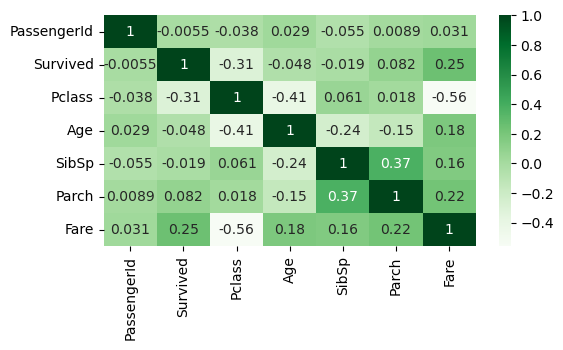

In [6]:
#Create heatmap to display correlation of all features
colormap = plt.cm.Greens
plt.figure(figsize=(6,3))
sns.heatmap(passenger_df.corr(), cmap=colormap, annot=True)

In [7]:
#Drop Cabin and Ticket number columns
passenger_df = passenger_df.drop(['Cabin','Ticket'], axis=1)
passenger_df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Fare,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,7.2500,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,71.2833,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,7.9250,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,53.1000,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,8.0500,S


In [8]:
#Combine SibSP and Parch into new column 'Family'
passenger_df['Family'] = passenger_df['SibSp'] + passenger_df['Parch']
passenger_df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Fare,Embarked,Family
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,7.2500,S,1
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,71.2833,C,1
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,7.9250,S,0
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,53.1000,S,1
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,8.0500,S,0


In [9]:
#Drop Name, Fare, Embark ID
new_passenger_df = passenger_df.drop(['PassengerId','Name', 'SibSp', 'Parch', 'Fare', 'Embarked'], axis=1)
new_passenger_df.head()

,Survived,Pclass,Sex,Age,Family
0,0,3,male,22.0,1
1,1,1,female,38.0,1
2,1,3,female,26.0,0
3,1,1,female,35.0,1
4,0,3,male,35.0,0


In [10]:
# saving the dataframe
new_passenger_df.to_csv('new_passenger_df.csv')

In [11]:
new_passenger_df.describe()

,Survived,Pclass,Age,Family
count,1309.000000,1309.000000,1046.000000,1309.000000
mean,0.384263,2.294882,29.881138,0.883881
std,0.486606,0.837836,14.413493,1.583639
min,0.000000,1.000000,0.170000,0.000000
25%,0.000000,2.000000,21.000000,0.000000
50%,0.000000,3.000000,28.000000,0.000000
75%,1.000000,3.000000,39.000000,1.000000
max,1.000000,3.000000,80.000000,10.000000


In [12]:
features=list(new_passenger_df.columns)
features.remove('Survived')
X=new_passenger_df[features]
X['Age']=X['Age'].fillna(0)
y=new_passenger_df['Survived']
print(X.shape)
print(y.shape)

(1309, 4)
(1309,)


C:\Users\koryk\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [13]:
sex_df=pd.get_dummies(X['Sex'], drop_first=True)
#embarked_df=pd.get_dummies(X['Embarked'])
X=pd.concat([X, sex_df], axis=1)
X=X.drop(columns=['Sex'])
X.head()

,Pclass,Age,Family,male
0,3,22.0,1,1
1,1,38.0,1,0
2,3,26.0,0,0
3,1,35.0,1,0
4,3,35.0,0,1


In [14]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test=train_test_split(X, y)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(981, 4)
(981,)
(328, 4)
(328,)


In [15]:
from sklearn.preprocessing import StandardScaler

scaler=StandardScaler()
scaler.fit(X_train)
X_train_scaled=scaler.transform(X_train)
X_test_scaled=scaler.transform(X_test)

# Decision Tree Classifier

In [16]:
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

In [17]:
# Creating the decision tree classifier instance.
model = tree.DecisionTreeClassifier(random_state=0)
# Fitting the model.
model = model.fit(X_train_scaled, y_train)

In [18]:
# Making predictions using the testing data.
predictions = model.predict(X_test_scaled)

In [19]:
# Calculating the confusion matrix
cm = confusion_matrix(y_test, predictions)

In [20]:
# Create a DataFrame from the confusion matrix.
cm_df = pd.DataFrame(
    cm, index=["Actual Victim", "Actual Survivor"], columns=["Predicted Victim", "Predicted Survivor"])

print("Confusion Matrix")
cm_df

Confusion Matrix


,Predicted Victim,Predicted Survivor
Actual Victim,167,28
Actual Survivor,52,81


In [21]:
conf_matrix = confusion_matrix(y_test, predictions)

conf_matrix

array([[167,  28],
       [ 52,  81]], dtype=int64)

In [22]:
true_neg, false_pos, false_neg, true_pos = conf_matrix.ravel()

true_neg, false_pos, false_neg, true_pos

(167, 28, 52, 81)

In [23]:
accuracy_score(y_test, predictions).round(2)

0.76

In [24]:
# Displaying results

print(f"Accuracy Score : {model.score(X_test_scaled, y_test):.2f}")
print("Classification Report")
print(classification_report(y_test, predictions))

Accuracy Score : 0.76
Classification Report
              precision    recall  f1-score   support

           0       0.76      0.86      0.81       195
           1       0.74      0.61      0.67       133

    accuracy                           0.76       328
   macro avg       0.75      0.73      0.74       328
weighted avg       0.75      0.76      0.75       328



In [25]:
#features_df = new_passenger_df.drop(['Sur'], axis=1)
feature_columns = X_train.columns
feature_columns

Index(['Pclass', 'Age', 'Family', 'male'], dtype='object')

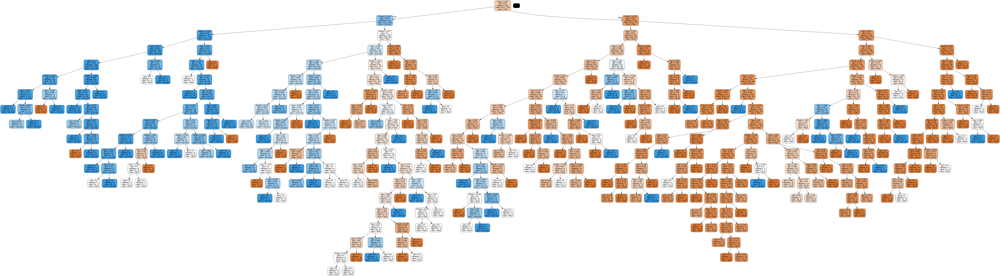

In [26]:
#Decision Tree Visualisation
from six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(model, out_file=dot_data,filled=True, rounded=True, feature_names=feature_columns, special_characters=True, class_names=['Died','Survived'])
#
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Titanic.png')
Image(graph.create_png())

In [27]:
# Create Decision Tree classifer object
model = DecisionTreeClassifier(max_depth=3)

# Train Decision Tree Classifer
model = model.fit(X_train.values,y_train.values)

#Predict the response for test dataset
y_pred = model.predict(X_test.values)

In [28]:
# Feature importance list
   
sorted(list(zip(model.feature_importances_, X_train.columns)), reverse=True)

[(0.7128370531899023, 'male'),
 (0.2142334832743664, 'Pclass'),
 (0.04856154453534077, 'Family'),
 (0.024367919000390526, 'Age')]

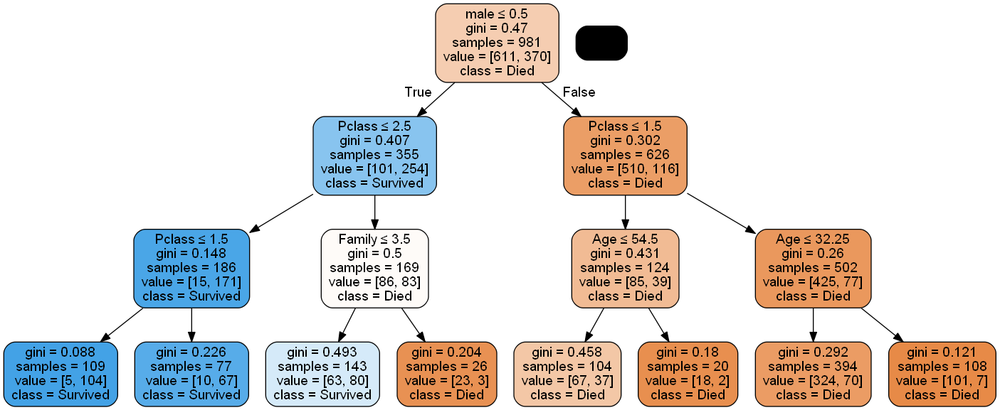

In [29]:
#Better Decision Tree Visualisation
from six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(model, out_file=dot_data,filled=True, rounded=True,special_characters=True, feature_names = feature_columns,class_names=['Died','Survived'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Titanic_condensed.png')
Image(graph.create_png())

In [30]:
from sklearn.tree import export_text
tree_rules = export_text(model, feature_names=list(X_train))
print(tree_rules)

|--- male <= 0.50
|   |--- Pclass <= 2.50
|   |   |--- Pclass <= 1.50
|   |   |   |--- class: 1
|   |   |--- Pclass >  1.50
|   |   |   |--- class: 1
|   |--- Pclass >  2.50
|   |   |--- Family <= 3.50
|   |   |   |--- class: 1
|   |   |--- Family >  3.50
|   |   |   |--- class: 0
|--- male >  0.50
|   |--- Pclass <= 1.50
|   |   |--- Age <= 54.50
|   |   |   |--- class: 0
|   |   |--- Age >  54.50
|   |   |   |--- class: 0
|   |--- Pclass >  1.50
|   |   |--- Age <= 32.25
|   |   |   |--- class: 0
|   |   |--- Age >  32.25
|   |   |   |--- class: 0



In [31]:

new_passenger_df.hvplot.scatter(x="Age", y="Survived", title="Survival Breakdown by Age and Class", by="Pclass")


:NdOverlay   [Pclass]
   :Scatter   [Age]   (Survived)

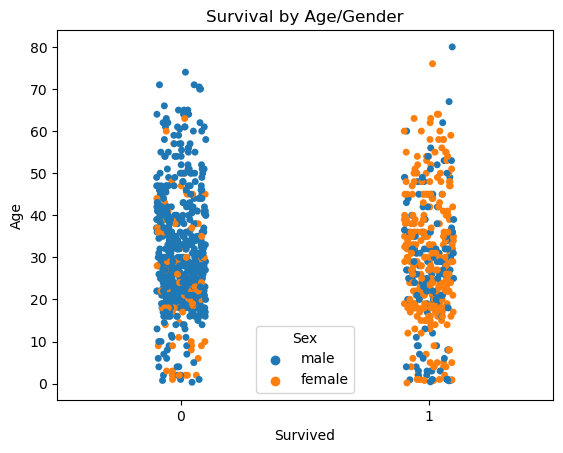

In [32]:
#sns.stripplot(data=new_passenger_df, x='Sex', y='Age', hue='Survived')
chart = sns.stripplot(data=new_passenger_df, x='Survived', y='Age', hue='Sex')

#plt.legend(loc='upper right', bbox_to_anchor=(1, 1))
chart.set_title('Survival by Age/Gender')

plt.show()

<AxesSubplot:title={'center':'Survival Breakdown by Class'}, xlabel='Survived', ylabel='Passenger Count'>

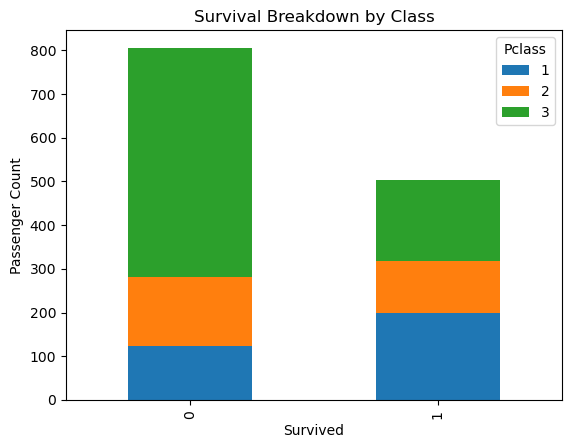

In [34]:
# Stacked Bar Chart, grouped by Pclass and Survival
new_passenger_df_plot = new_passenger_df.groupby(['Pclass', 'Survived']).size().reset_index().pivot(columns='Pclass', index='Survived', values=0)
new_passenger_df_plot.plot(kind='bar', ylabel="Passenger Count", title='Survival Breakdown by Class', stacked=True)


Text(0.5, 1.0, 'Survival Breakdown by Gender')

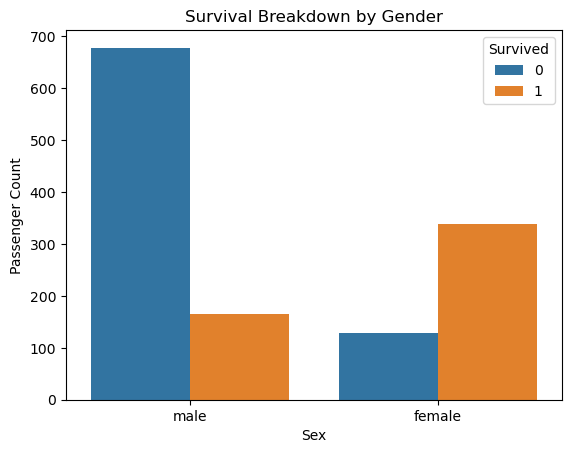

In [35]:
# Count plot
#https://datagy.io/seaborn-countplot/
sns.countplot(data = new_passenger_df, x ="Sex", hue ="Survived")
plt.ylabel("Passenger Count")
plt.title("Survival Breakdown by Gender")

In [37]:
#Find correlation between features
corr = new_passenger_df.corr()
corr

,Survived,Pclass,Age,Family
Survived,1.000000,-0.306273,-0.047579,0.032152
Pclass,-0.306273,1.000000,-0.408106,0.050027
Age,-0.047579,-0.408106,1.000000,-0.240229
Family,0.032152,0.050027,-0.240229,1.000000


<AxesSubplot:>

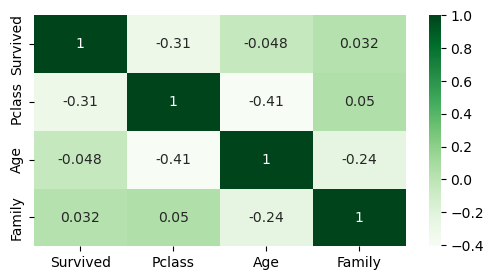

In [38]:
#Create heatmap to display correlation of features
colormap = plt.cm.Greens
plt.figure(figsize=(6,3))
sns.heatmap(new_passenger_df.corr(), cmap=colormap, annot=True)

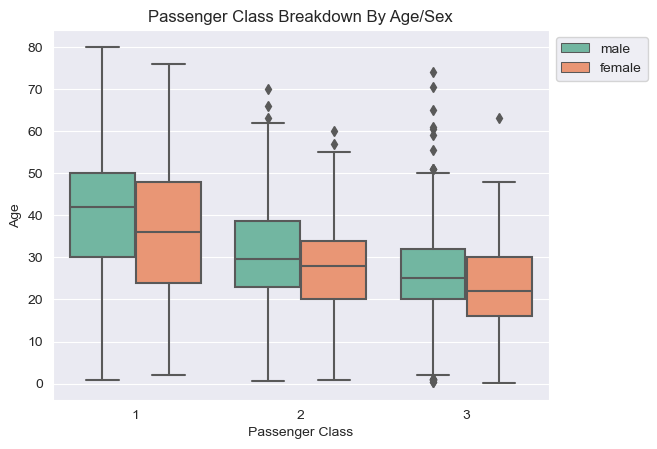

In [39]:
#Boxplot
#https://datagy.io/seaborn-boxplot/
# Creating our first boxplot

sns.set_style('darkgrid')
sns.set_palette('Set2')

#Split by sex
sns.boxplot(data=new_passenger_df, x='Pclass', y='Age', hue='Sex')

#Sex grouped
#sns.boxplot(data=new_passenger_df, x='Pclass', y='Age')

plt.title('Passenger Class Breakdown By Age/Sex')
plt.xlabel('Passenger Class')
plt.ylabel('Age')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

plt.show()